In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib_inline.backend_inline import set_matplotlib_formats
from scipy.ndimage import binary_fill_holes, label, generate_binary_structure, convolve
from scipy.stats import linregress
import random
import seaborn as sns


set_matplotlib_formats('png', dpi=150)

In [30]:
# --- Config ---
lattice_height = 2000
lattice_width = 2000
fill_probability = 0.405
feature_area_threshold = 1000
convolution_structure = generate_binary_structure(rank=2, connectivity=1)  # 4-connected

In [31]:
# --- Generate random lattice ---
def generate_lattice(width, height, prob):
    return np.random.rand(height, width) < prob

# --- Filter small features ---
def filter_features_over_threshold(labeled_features, num_features, threshold):
    counts = np.bincount(labeled_features.ravel())
    valid = counts > threshold
    valid[0] = False  # background stays 0
    mask = valid[labeled_features]
    filtered_labels, new_count = label(mask, structure=convolution_structure)
    return filtered_labels, new_count

# --- Check if a feature touches image border ---
def touches_edge(coords, shape):
    return (
        (coords[:, 0] == 0).any() or
        (coords[:, 0] == shape[0] - 1).any() or
        (coords[:, 1] == 0).any() or
        (coords[:, 1] == shape[1] - 1).any()
    )

def crop_to_bounding_box(mask):
    """
    Crops a binary mask to the tightest bounding box around the non-zero region.
    Assumes there is exactly one connected component (cloud) in the mask.

    Parameters:
        mask : 2D boolean np.ndarray

    Returns:
        cropped : 2D boolean np.ndarray (cropped region)
    """
    rows, cols = np.where(mask)
    if rows.size == 0:
        return np.zeros((0, 0), dtype=bool)  # Empty case

    row_min, row_max = rows.min(), rows.max() + 1
    col_min, col_max = cols.min(), cols.max() + 1
    return mask[row_min:row_max, col_min:col_max]

def compute_perimeter(mask):
    """
    Computes the 4-connected perimeter (pixel-side length) of a binary cloud mask.

    Parameters:
        mask : 2D boolean np.ndarray (cropped)

    Returns:
        perimeter : int
    """
    kernel = np.array([[0, 1, 0],
                       [1, 0, 1],
                       [0, 1, 0]])
    neighbors = convolve(mask.astype(np.uint8), kernel, mode='constant', cval=0)
    return np.sum(mask * (4 - neighbors))

def compute_area(mask):
    """
    Computes the area (number of True pixels) in a binary mask.

    Parameters:
        mask : 2D boolean np.ndarray (cropped)

    Returns:
        area : int
    """
    return np.count_nonzero(mask)

def count_edge_contacts(coords, shape):
    """
    Returns the number of pixels in the feature that touch each image edge.
    
    Parameters:
        coords : np.ndarray of shape (N, 2)
            Coordinates of pixels in the feature.
        shape : tuple
            Shape of the full image (height, width)
    
    Returns:
        edge_counts : np.ndarray of shape (4,)
            Number of pixels touching [left, top, right, bottom] edges respectively.
    """
    rows, cols = coords[:, 0], coords[:, 1]
    height, width = shape

    left_count   = np.sum(cols == 0)
    top_count    = np.sum(rows == 0)
    right_count  = np.sum(cols == width - 1)
    bottom_count = np.sum(rows == height - 1)

    return np.array([left_count, top_count, right_count, bottom_count])

def interpret_edge_touch(edge_counts):
    """
    Interprets how a cloud touches the edges of the image.

    Parameters:
        edge_counts : np.ndarray of shape (4,)
            Number of pixels touching [left, top, right, bottom] edges.

    Returns:
        int:
            0  → no edge touched
            1  → exactly one edge touched
            2  → exactly two adjacent edges touched
            -1 → otherwise (non-adjacent pairs or >= 3 edges touched)
    """
    # Find which edges are touched
    left = edge_counts[0] > 0
    top = edge_counts[1] > 0
    right = edge_counts[2] > 0
    bottom = edge_counts[3] > 0

    num_touched = np.count_nonzero(edge_counts)

    if num_touched == 0:
        return 0
    elif num_touched == 1:
        return 1
    elif num_touched == 2:
        if (left and right) or (top and bottom):
            return -1
        else: 
            return 2
    else:
        return -1

def plot_loglog_with_fit(areas, perims, title):
    log_area = np.log(areas)
    log_perim = np.log(perims)
    slope, intercept, r_value, _, _ = linregress(log_area, log_perim)
    D = 2 * slope
    r2 = r_value ** 2

    plt.figure(figsize=(6, 5))
    plt.loglog(areas, perims, 'o', markersize=2, alpha=0.6, label='Data')
    plt.loglog(areas, np.exp(intercept) * areas**slope, 'r--',
               label=f'Fit: slope={slope:.4f} → D={D:.4f}')
    plt.xlabel('Area (log scale)')
    plt.ylabel('Perimeter (log scale)')
    plt.title(f'{title}\nFractal Dimension ≈ {D:.4f}, R² = {r2:.4f}')
    plt.legend()
    plt.grid(True, which='both', ls='--', lw=0.5)
    plt.tight_layout()
    plt.show()

    print(f"{title}")
    print(f"  Slope (log-log): {slope:.4f}")
    print(f"  Estimated fractal dimension D: {D:.4f}")
    print(f"  R²: {r2:.4f}\n")

def compute_loglog_stats(areas, perims, return_slope_intercept=False):
    """
    Computes slope, intercept, fractal dimension D, and R² from log-log fit.
    
    Parameters:
        areas : np.ndarray
        perims : np.ndarray
        return_slope_intercept : bool — if True, also returns slope and intercept

    Returns:
        D, R²               (if return_slope_intercept is False)
        slope, D, R²        (if return_slope_intercept is True)
    """
    if len(areas) == 0 or len(perims) == 0:
        return None

    log_area = np.log(areas)
    log_perim = np.log(perims)
    slope, intercept, r_value, _, _ = linregress(log_area, log_perim)
    D = 2 * slope
    r2 = r_value ** 2

    if return_slope_intercept:
        return slope, intercept, D, r2
    else:
        return D, r2

def truncate_with_edge_exposure(mask, num_cuts=1):

    """
    Truncates a 2D binary/numeric mask along vertical and/or horizontal axes,
    resizing the grid and reporting how many non-zero pixels were exposed on
    edges that result from the cut(s).

    Parameters:
        mask : 2D np.ndarray
            A cropped region containing a single object or cloud.
        num_cuts : int
            Number of cuts to apply: 0, 1 (default), or 2.

    Returns:
        truncated : 2D np.ndarray
            The resized (cropped) array after truncation.
        exposed_edge_counts : np.ndarray([left, top, right, bottom])
            Non-zero pixels exposed only on cut-created edges.
    """
    height, width = mask.shape
    row_start, row_end = 0, height
    col_start, col_end = 0, width

    # Track which edges were cut
    cut_edges = {"left": False, "top": False, "right": False, "bottom": False}

    if num_cuts == 0:
        truncated = mask.copy()
    else:
        cuts_to_do = []
        if num_cuts == 1:
            cuts_to_do = [np.random.choice(['vertical', 'horizontal'])]
        elif num_cuts == 2:
            cuts_to_do = ['vertical', 'horizontal']

        for direction in cuts_to_do:
            if direction == 'vertical' and width > 2:
                cut_col = np.random.randint(1, width)
                if np.random.rand() < 0.5:
                    # Keep RIGHT side → exposed edge = left
                    col_start = cut_col
                    cut_edges["left"] = True
                else:
                    # Keep LEFT side → exposed edge = right
                    col_end = cut_col
                    cut_edges["right"] = True

            elif direction == 'horizontal' and height > 2:
                cut_row = np.random.randint(1, height)
                if np.random.rand() < 0.5:
                    # Keep BOTTOM side → exposed edge = top
                    row_start = cut_row
                    cut_edges["top"] = True
                else:
                    # Keep TOP side → exposed edge = bottom
                    row_end = cut_row
                    cut_edges["bottom"] = True

        # Apply slicing
        truncated = mask[row_start:row_end, col_start:col_end]

    # Compute edge counts only for the cut-exposed edges
    exposed_edge_counts = np.zeros(4, dtype=int)  # [left, top, right, bottom]
    if truncated.size > 0:
        if cut_edges["left"]:
            exposed_edge_counts[0] = np.count_nonzero(truncated[:, 0])
        if cut_edges["top"]:
            exposed_edge_counts[1] = np.count_nonzero(truncated[0, :])
        if cut_edges["right"]:
            exposed_edge_counts[2] = np.count_nonzero(truncated[:, -1])
        if cut_edges["bottom"]:
            exposed_edge_counts[3] = np.count_nonzero(truncated[-1, :])

    return truncated, exposed_edge_counts

def plot_D_distributions(results, bins=20):
    """
    Plots the distributions of D_real and D_mirror values from the benchmarking results.
    
    Parameters:
        results : list of dicts
            Each dict should contain keys 'D_real' and 'D_mirror'
        bins : int
            Number of bins to use for the histogram
    """
    D_real = [r["D_real"] for r in results if r.get("D_real") is not None]
    D_mirror = [r["D_mirror"] for r in results if r.get("D_mirror") is not None]

    plt.figure(figsize=(10, 5))
    sns.histplot(D_real, color='skyblue', label='D (Real)', kde=True, stat='density', bins=bins, alpha=0.6)
    sns.histplot(D_mirror, color='orange', label='D (Mirrored)', kde=True, stat='density', bins=bins, alpha=0.6)

    mean_real = np.mean(D_real)
    mean_mirror = np.mean(D_mirror)

    plt.axvline(mean_real, color='blue', linestyle='--', label=f'Mean Real D = {mean_real:.4f}')
    plt.axvline(mean_mirror, color='darkorange', linestyle='--', label=f'Mean Mirror D = {mean_mirror:.4f}')

    plt.title("Distribution of Fractal Dimension (D)\nReal vs Mirrored Clouds")
    plt.xlabel("Fractal Dimension (D)")
    plt.ylabel("Density")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()

In [38]:
def plot_cloud_comparison(lattice, cloud_id, original_mask, truncated_mask, mirrored_mask):
    """
    Plots a 4-panel visualization of:
    - Full lattice
    - Original cloud
    - Truncated version
    - Mirrored approximation
    """
    fig, axs = plt.subplots(1, 4, figsize=(16, 4))

    axs[0].imshow(lattice, cmap='gray')
    axs[0].set_title('Original Lattice')
    axs[0].axis('off')

    axs[1].imshow(original_mask, cmap='gray')
    axs[1].set_title(f'Original Cloud #{cloud_id}')
    axs[1].axis('off')

    axs[2].imshow(truncated_mask, cmap='gray')
    axs[2].set_title('Truncated Cloud')
    axs[2].axis('off')

    axs[3].imshow(mirrored_mask, cmap='gray')
    axs[3].set_title('Mirrored Cloud (Approx.)')
    axs[3].axis('off')

    plt.tight_layout()
    plt.show()


def visualize_sample_clouds(lattice, labeled_features, max_clouds=3, num_cuts=1):
    """
    Randomly selects a few internal clouds and visualizes their:
    - Original form
    - Truncated version
    - Mirrored reconstruction

    Parameters:
        lattice : 2D np.ndarray (bool)
        labeled_features : 2D np.ndarray (int)
        max_clouds : int
        num_cuts : int (1 or 2)
    """
    all_ids = list(np.unique(labeled_features))
    all_ids = [x for x in all_ids if x != 0]
    random.shuffle(all_ids)

    shown = 0
    for cloud_id in all_ids:
        if shown >= max_clouds:
            break

        mask = labeled_features == cloud_id
        coords = np.argwhere(mask)

        # Check that it's internal
        if interpret_edge_touch(count_edge_contacts(coords, mask.shape)) != 0:
            continue

        cropped = crop_to_bounding_box(mask)
        chopped, exposed = truncate_with_edge_exposure(cropped, num_cuts=num_cuts)

        if chopped.size == 0:
            continue

        # Approximate mirrored reconstruction
        mirrored = chopped.copy()
        if exposed[0] > 0:  # left edge exposed → mirror left to right
            mirrored = np.concatenate([np.flip(chopped, axis=1), chopped], axis=1)
        elif exposed[2] > 0:  # right edge exposed → mirror right to left
            mirrored = np.concatenate([chopped, np.flip(chopped, axis=1)], axis=1)

        if exposed[1] > 0:  # top edge exposed → mirror top to bottom
            mirrored = np.concatenate([np.flip(mirrored, axis=0), mirrored], axis=0)
        elif exposed[3] > 0:  # bottom edge exposed → mirror bottom to top
            mirrored = np.concatenate([mirrored, np.flip(mirrored, axis=0)], axis=0)

        plot_cloud_comparison(lattice, cloud_id, cropped, chopped, mirrored)
        shown += 1

In [33]:
results = []

runs = 500

for i in range(1, runs+1):  # 20 runs
    print(f"\n--- Run {i} ---")

    # Generate and process lattice
    lattice = generate_lattice(lattice_width, lattice_height, fill_probability)
    filled_lattice = binary_fill_holes(lattice, structure=convolution_structure)
    labeled_features, num_features = label(filled_lattice, structure=convolution_structure)
    labeled_features, num_features = filter_features_over_threshold(labeled_features, num_features, feature_area_threshold)

    areas_full, perims_full = [], []
    areas_mirror, perims_mirror = [], []

    for label_id in range(1, num_features + 1):
        mask = (labeled_features == label_id)
        coords = np.argwhere(mask)
        edge_counts = count_edge_contacts(coords, mask.shape)
        edge_case = interpret_edge_touch(edge_counts)

        if edge_case == 0:  # fully internal
            cropped = crop_to_bounding_box(mask)
            areas_full.append(compute_area(cropped))
            perims_full.append(compute_perimeter(cropped))

            # Simulate truncation + mirroring
            num_cuts = 1
            chopped, exposed = truncate_with_edge_exposure(cropped, num_cuts=num_cuts)
            if chopped.size == 0: continue

            synthetic_area = compute_area(chopped) * 2 * num_cuts
            synthetic_perim = (compute_perimeter(chopped) - np.sum(exposed)) * 2 * num_cuts

            areas_mirror.append(synthetic_area)
            perims_mirror.append(synthetic_perim)

    # Convert to arrays
    areas_full = np.array(areas_full)
    perims_full = np.array(perims_full)
    areas_mirror = np.array(areas_mirror)
    perims_mirror = np.array(perims_mirror)

    # Compute stats (refactored helper)
    real_fit = compute_loglog_stats(areas_full, perims_full, return_slope_intercept=True)
    mirror_fit = compute_loglog_stats(areas_mirror, perims_mirror, return_slope_intercept=True)

    if real_fit and mirror_fit:
        slope_real, _, D_real, R2_real = real_fit
        slope_mirror, _, D_mirror, R2_mirror = mirror_fit

        results.append({
            "run": i,
            "n_clouds": len(areas_full),
            "slope_real": slope_real,
            "slope_mirror": slope_mirror,
            "D_real": D_real,
            "D_mirror": D_mirror,
            "R2_real": R2_real,
            "R2_mirror": R2_mirror,
            "delta_D": (D_real - D_mirror),
            "delta_slope": (slope_real - slope_mirror),
            "delta_R2": (R2_real - R2_mirror)
        })

        print(f"  D_real    = {D_real:.4f}, R² = {R2_real:.4f}")
        print(f"  D_mirror  = {D_mirror:.4f}, R² = {R2_mirror:.4f}")
        print(f"  ΔD = {(D_real - D_mirror):.4f}, Δslope = {(slope_real - slope_mirror):.4f}, ΔR² = {(R2_real - R2_mirror):.4f}")
    else:
        print("  Skipped: Not enough valid data in one or both datasets.")

# --- Print Summary Table ---
print("\n=== Summary Across Runs ===")
for r in results:
    print(f"Run {r['run']:2d} | Clouds: {r['n_clouds']:3d} | "
          f"D: {r['D_real']:.4f} vs {r['D_mirror']:.4f} | "
          f"ΔD = {r['delta_D']:.4f}, ΔR² = {r['delta_R2']:.4f}")



--- Run 1 ---
  D_real    = 1.3287, R² = 0.9168
  D_mirror  = 1.3841, R² = 0.9611
  ΔD = -0.0554, Δslope = -0.0277, ΔR² = -0.0443

--- Run 2 ---
  D_real    = 1.3388, R² = 0.9308
  D_mirror  = 1.3859, R² = 0.9676
  ΔD = -0.0471, Δslope = -0.0236, ΔR² = -0.0368

--- Run 3 ---
  D_real    = 1.3488, R² = 0.9152
  D_mirror  = 1.3776, R² = 0.9734
  ΔD = -0.0288, Δslope = -0.0144, ΔR² = -0.0581

--- Run 4 ---
  D_real    = 1.3637, R² = 0.9253
  D_mirror  = 1.4068, R² = 0.9619
  ΔD = -0.0430, Δslope = -0.0215, ΔR² = -0.0366

--- Run 5 ---
  D_real    = 1.3275, R² = 0.9183
  D_mirror  = 1.3754, R² = 0.9712
  ΔD = -0.0479, Δslope = -0.0240, ΔR² = -0.0529

--- Run 6 ---
  D_real    = 1.3740, R² = 0.9307
  D_mirror  = 1.4144, R² = 0.9704
  ΔD = -0.0404, Δslope = -0.0202, ΔR² = -0.0397

--- Run 7 ---
  D_real    = 1.3286, R² = 0.9272
  D_mirror  = 1.3478, R² = 0.9677
  ΔD = -0.0192, Δslope = -0.0096, ΔR² = -0.0405

--- Run 8 ---
  D_real    = 1.2902, R² = 0.8984
  D_mirror  = 1.3280, R² = 0.9623


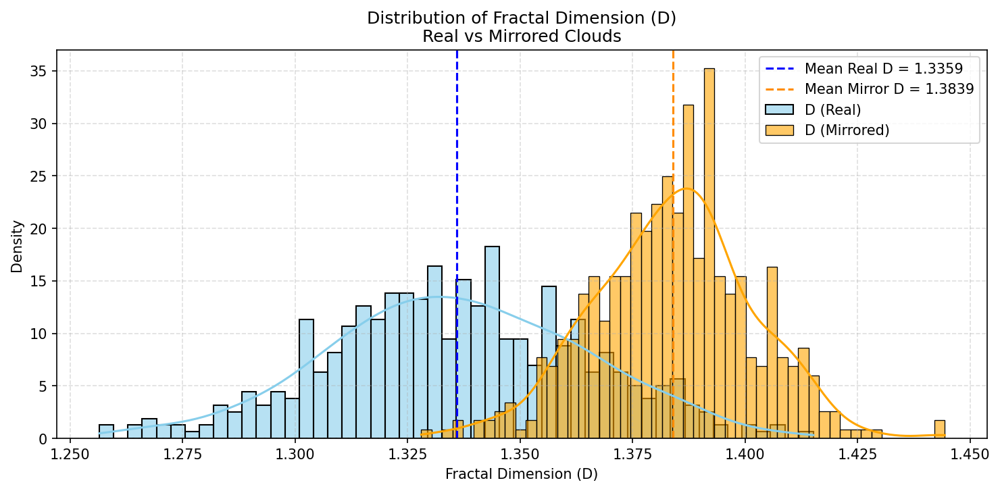

In [ ]:
plot_D_distributions(results, bins=50)



In [35]:
import pandas as pd

# Convert results list of dicts to DataFrame
df_results = pd.DataFrame(results)

# Save to CSV file
df_results.to_csv("fractal_dim_results.csv", index=False)

print("Saved results to fractal_dim_results.csv")

Saved results to fractal_dim_results.csv


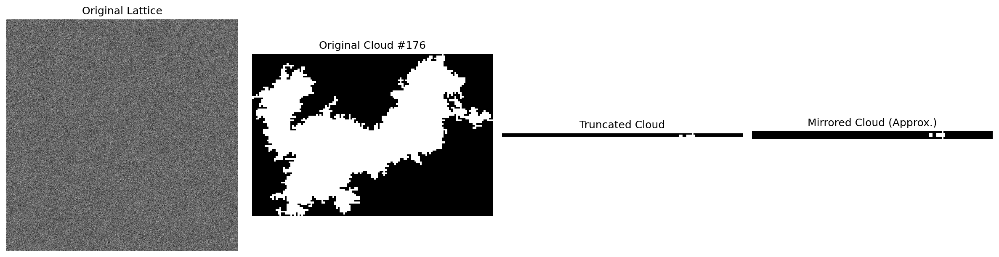

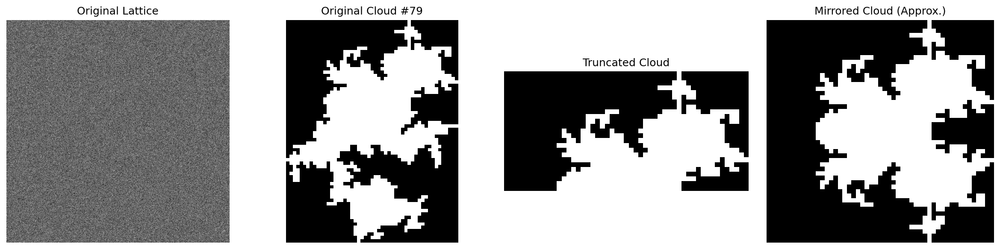

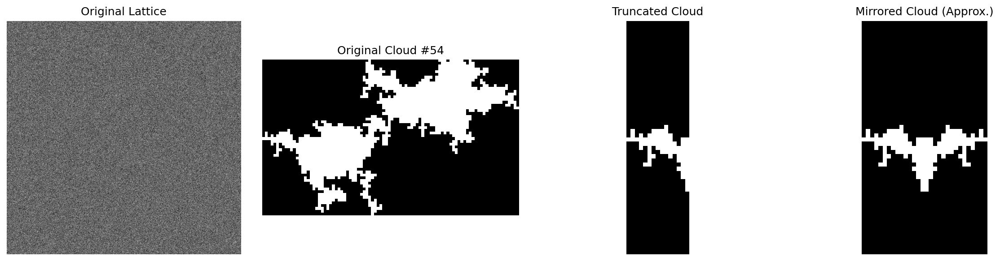

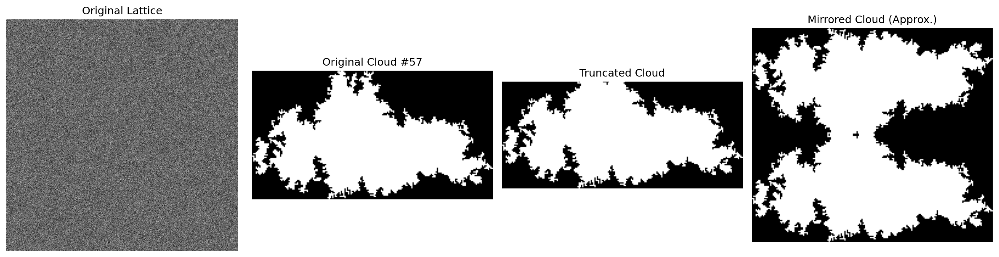

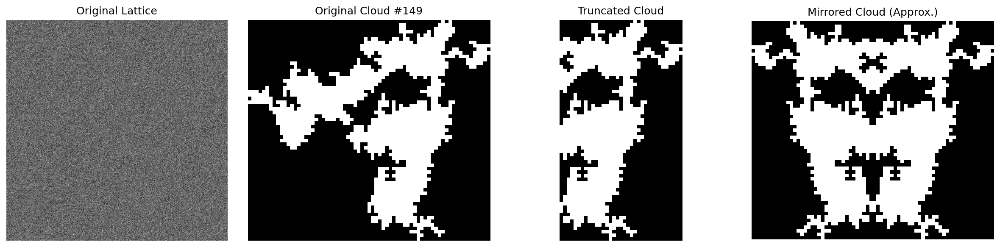

...

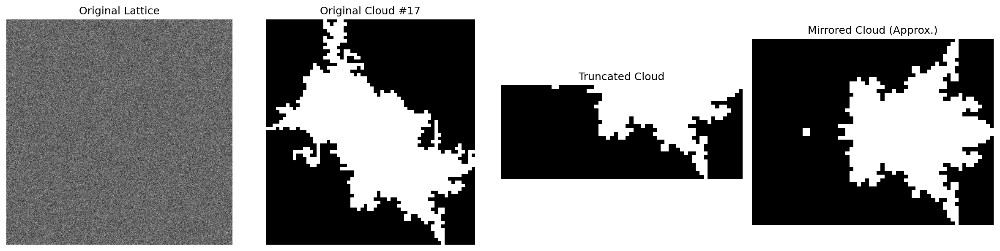

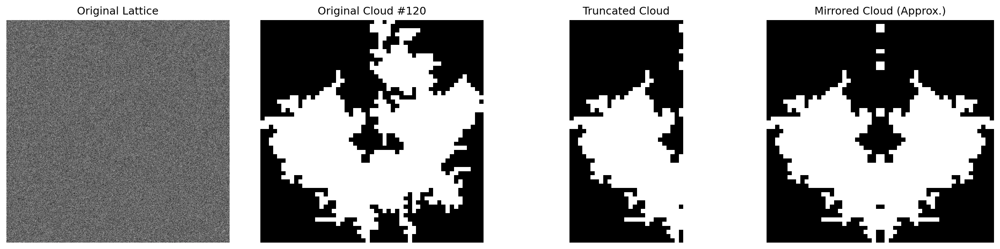

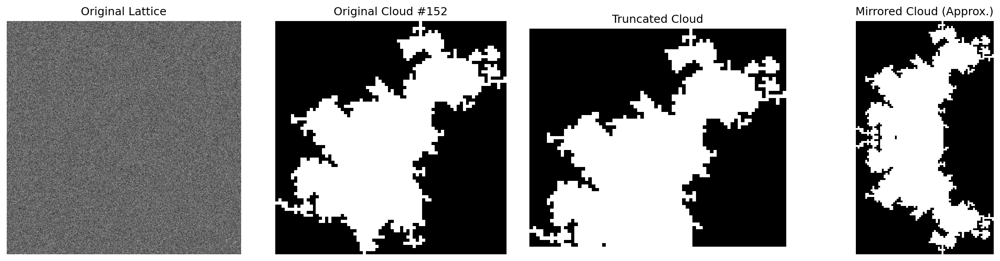

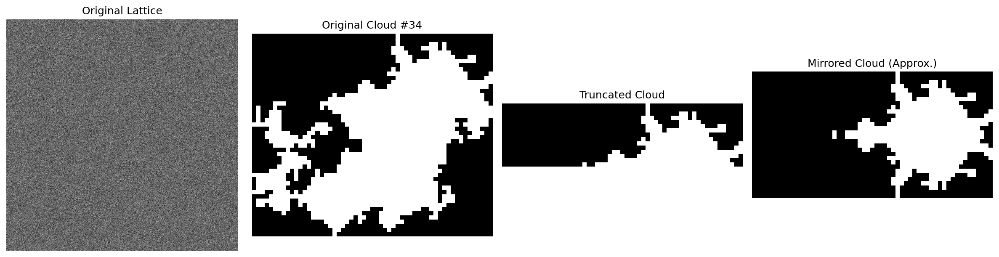

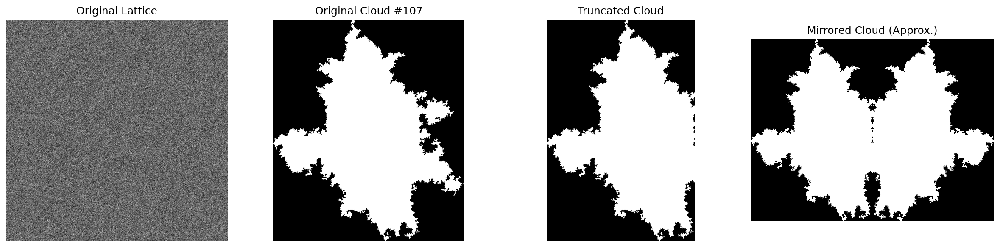

In [39]:
visualize_sample_clouds(lattice, labeled_features, max_clouds=15, num_cuts=1)

In [ ]:
# --- Main pipeline ---
lattice = generate_lattice(lattice_width, lattice_height, fill_probability)
filled_lattice = binary_fill_holes(lattice, structure=convolution_structure)
labeled_features, num_features = label(filled_lattice, structure=convolution_structure)
labeled_features, num_features = filter_features_over_threshold(labeled_features, num_features, feature_area_threshold)

# --- Prepare containers ---
areas_full, perims_full = [], []
areas_mirror, perims_mirror = [], []
mask_internal = np.zeros_like(labeled_features, dtype=bool)
mask_mirrored = np.zeros_like(labeled_features, dtype=bool)
mask_discarded = np.zeros_like(labeled_features, dtype=bool)
internal_ids, mirrored_ids = [], []

# --- Feature analysis loop ---
for label_id in range(1, num_features + 1):
    mask = labeled_features == label_id
    coords = np.argwhere(mask)
    edge_counts = count_edge_contacts(coords, mask.shape)
    valid_edges_hit = interpret_edge_touch(edge_counts)

    if valid_edges_hit == 0:
        # Fully internal feature
        area, perimeter = compute_area_and_perimeter(mask)
        areas_full.append(area)
        perims_full.append(perimeter)
        mask_internal |= mask
        internal_ids.append(label_id)

    elif valid_edges_hit == 1 or valid_edges_hit == 2:
        # Eligible for mirroring
        area, perimeter = compute_area_and_perimeter(mask)
        mirrored_area = area * valid_edges_hit * 2
        mirrored_perimeter = (perimeter - np.sum(edge_counts)) * valid_edges_hit * 2
        areas_mirror.append(mirrored_area)
        perims_mirror.append(mirrored_perimeter)
        mask_mirrored |= mask
        mirrored_ids.append(label_id)
    else:
        mask_discarded |= mask  # not used in stats but visualized

# --- Convert to arrays ---
areas_full = np.array(areas_full)
perims_full = np.array(perims_full)
areas_mirror = np.array(areas_mirror)
perims_mirror = np.array(perims_mirror)

# --- Visualization of classification ---
visual = np.zeros((*labeled_features.shape, 3), dtype=np.float32)
visual[mask_internal] = [1.0, 1.0, 1.0]   # white = internal
visual[mask_mirrored] = [0.3, 0.5, 1.0]   # blue = mirrored
visual[mask_discarded] = [0.3, 0.3, 0.3]  # gray = discarded

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("Original Lattice")
plt.imshow(lattice, cmap='gray', interpolation='nearest')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Filled Lattice")
plt.imshow(filled_lattice, cmap='gray', interpolation='nearest')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Cloud Classification")
plt.imshow(visual, interpolation='nearest')
plt.axis('off')

plt.tight_layout()
plt.show()

# --- Ratio summary ---
n_internal = len(internal_ids)
n_mirrored = len(mirrored_ids)
n_total = n_internal + n_mirrored
n_discarded = num_features - n_total

print(f"\n=== Cloud Classification Summary ===")
print(f"Total labeled features: {num_features}")
print(f"  Internal (valid):  {n_internal} ({n_internal / num_features:.2%})")
print(f"  Mirrored (valid):  {n_mirrored} ({n_mirrored / num_features:.2%})")
print(f"  Discarded:          {n_discarded} ({n_discarded / num_features:.2%})")

# --- Log-log slope plots ---
if len(areas_full) > 0:
    plot_loglog_with_fit(areas_full, perims_full, "Internal Clouds Only")

if len(areas_mirror) > 0:
    plot_loglog_with_fit(areas_mirror, perims_mirror, "Mirrored Clouds Only")

if len(areas_full) > 0 and len(areas_mirror) > 0:
    plot_loglog_with_fit(
        np.concatenate([areas_full, areas_mirror]),
        np.concatenate([perims_full, perims_mirror]),
        "Combined: Internal + Mirrored Clouds"
    )